In [217]:
import pandas as pd

In [218]:
tennis_courts = pd.read_csv('tennis_courts.csv')

In [219]:
tennis_courts.groupby('address').count().sort_values('index', ascending = False)

,index,name,city,state,zip_code,type,count,clay,wall,grass,indoor,lights,proshop,latitude,longitude
address,,,,,,,,,,,,,,,
new york,2663,2663,2663,2663,2663,2663,2663,2663,2663,2663,2663,2663,2663,2663,2663
atlanta,2305,2305,2305,2305,2305,2305,2305,2305,2305,2305,2305,2305,2305,2305,2305
los angeles,1879,1879,1879,1879,1879,1879,1879,1879,1879,1879,1879,1879,1879,1879,1879
chicago,1387,1387,1387,1387,1387,1387,1387,1387,1387,1387,1387,1387,1387,1387,1387
miami-fort lauderdale,1162,1162,1162,1162,1162,1162,1162,1162,1162,1162,1162,1162,1162,1162,1162
boston,1052,1052,1052,1052,1052,1052,1052,1052,1052,1052,1052,1052,1052,1052,1052
houston - galveston - brazoria,1049,1049,1049,1049,1049,1049,1049,1049,1049,1049,1049,1049,1049,1049,1049
san francisco - oakland - san jose,973,973,973,973,973,973,973,973,973,973,973,973,973,973,973
dallas - fort worth,952,952,952,952,952,952,952,952,952,952,952,952,952,952,952


In [220]:
tennis_courts[(tennis_courts['address'] == 'boston') & (tennis_courts['zip_code'] == 'Public')]

,index,name,address,city,state,zip_code,type,count,clay,wall,grass,indoor,lights,proshop,latitude,longitude
14,14,Vine Street,boston,ma,1945.0,Public,3,False,False,False,False,False,False,42.499006,-70.861334,"{""clay""=>""0"", ""type""=>""Public"", ""wall""=>""0"", ""..."
83,83,Ainsworth Place,boston,ma,1905.0,Public,1,False,False,False,False,False,False,42.463075,-70.974780,"{""clay""=>""0"", ""type""=>""Public"", ""wall""=>""0"", ""..."
135,135,Damon Avenue,boston,ma,2176.0,Public,2,False,False,False,False,False,False,42.467998,-71.057457,"{""clay""=>""0"", ""type""=>""Public"", ""wall""=>""0"", ""..."
156,156,Bolton Street,boston,ma,1749.0,Public,6,False,False,False,False,False,False,42.369920,-71.564727,"{""clay""=>""0"", ""type""=>""Public"", ""wall""=>""0"", ""..."
225,225,Pine Street,boston,ma,2466.0,Public,2,False,False,False,False,False,False,42.353026,-71.242475,"{""clay""=>""0"", ""type""=>""Public"", ""wall""=>""0"", ""..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29792,29792,Boston Road,boston,ma,1824.0,Public,4,False,False,False,False,False,False,42.576336,-71.334894,"{""clay""=>""0"", ""type""=>""Public"", ""wall""=>""0"", ""..."
29794,29794,Beacon Street,boston,ma,2446.0,Public,6,True,False,False,False,False,False,42.345311,-71.112775,"{""clay""=>""1"", ""type""=>""Public"", ""wall""=>""0"", ""..."
29795,29795,Lorene Road,boston,ma,2130.0,Public,2,False,False,False,False,False,False,42.314496,-71.105972,"{""clay""=>""0"", ""type""=>""Public"", ""wall""=>""0"", ""..."
29797,29797,Old Sanford Road,boston,ma,3901.0,Public,3,False,False,False,False,False,False,43.291170,-70.827473,"{""clay""=>""0"", ""type""=>""Public"", ""wall""=>""0"", ""..."


In [221]:
# at night? lights

In [222]:
tennis_courts['lights'].value_counts()

False    29796
True       163
Name: lights, dtype: int64

In [233]:
# is public? 

311 / (851 + 311)

0.2676419965576592

In [232]:
tennis_courts[tennis_courts['address'].str.contains('miami')]['zip_code'].value_counts()

Homeowners Community    851
Public                  311
Name: zip_code, dtype: int64

In [3]:
zipcode_incomes = pd.read_csv('postcode_level_averages.csv')

In [15]:
zipcode_incomes['zipcode'] = zipcode_incomes['zipcode'].astype(str)

In [12]:
tennis_courts['zipcodes'] = tennis_courts['state'].astype(str).str.split('.').str[0]

In [17]:
tennis_courts_incomes = tennis_courts.merge(zipcode_incomes, left_on = 'zipcodes', right_on = 'zipcode', how = 'left')

In [24]:
courts_count_incomes = tennis_courts_incomes.groupby('address', as_index = False).agg({'index': 'count', 'avg_income': 'mean'})

In [36]:
courts_count_incomes.sort_values('index').head(10)

,address,index,avg_income
53,wilmington-newark,120,77345.699566
39,providence,127,78900.115584
15,fresno,150,64708.559936
42,rochester,151,69909.787730
33,oklahoma city,155,69455.312326
26,memphis,167,75070.716645
0,albany,168,80836.566116
5,buffalo-niagara falls,182,70918.943287
12,dayton-springfield,185,63289.256204
25,louisville,192,75688.693555


In [26]:
import seaborn as sns

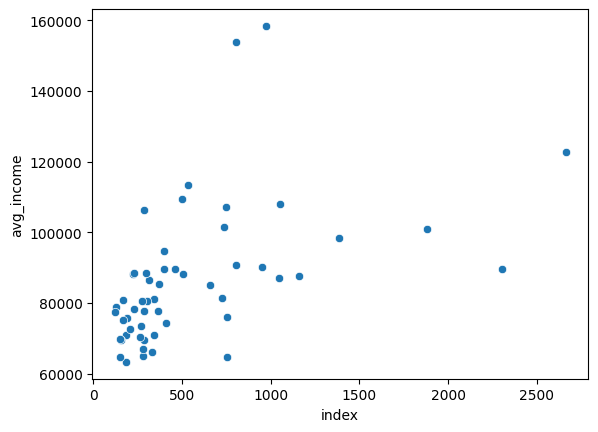

In [29]:
sns.scatterplot(x = 'index', y = 'avg_income', data = courts_count_incomes);

In [31]:
tennis_courts_incomes.to_csv('tennis_courts_with_incomes.csv')

In [46]:
tennis_courts_incomes.groupby(['zipcodes', 'address'], as_index = 'False').agg({'index': 'count', 'avg_income': 'mean'}).sort_values('index', ascending = False).head(30)

,,index,avg_income
zipcodes,address,,
30022,atlanta,76,139978.554779
30062,atlanta,70,113258.004640
30024,atlanta,63,112062.696443
30096,atlanta,54,57976.826274
30075,atlanta,53,152863.755796
30043,atlanta,51,60317.039801
92264,los angeles,50,87538.768898
30040,atlanta,49,97350.401666
30067,atlanta,47,113526.669759


In [ ]:
# spatial disparities: even in places with high incomes, tennis courts are not spread uniformly
# more in areas with low incomes

In [65]:
atlanta = tennis_courts_incomes[tennis_courts_incomes['address'].str.contains('boston')].groupby('zipcode', as_index = False).agg({'index': 'count', 'avg_income': 'mean'})

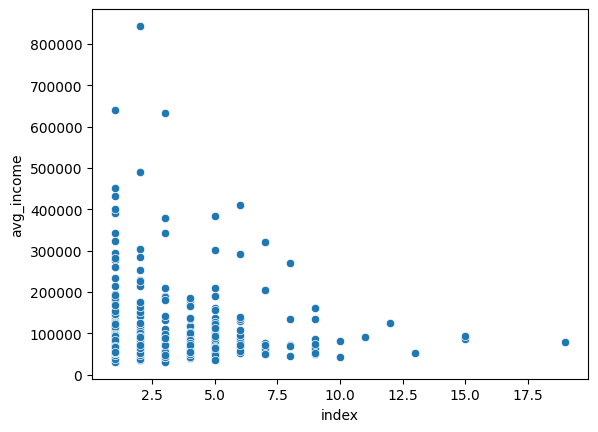

In [66]:
sns.scatterplot(x = 'index', y = 'avg_income', data = atlanta);

In [69]:
# mesa az?  -> courts available per booking? 🐦‍🔥 

In [70]:
mesa_bookings = tennis_courts = pd.read_csv('tenniscourts.csv')

/var/folders/__/8q6wtgc10gsdhs_z1lv_0r700000gn/T/ipykernel_3018/3711333692.py:1: DtypeWarning: Columns (28,30,31,45,46,47,48,49,50) have mixed types. Specify dtype option on import or set low_memory=False.
  mesa_bookings = tennis_courts = pd.read_csv('tenniscourts.csv')


In [74]:
mesa_bookings['zipcodes'] = mesa_bookings['Center Zip Code'].astype(str)
mesa_bookings_incomes = mesa_bookings.merge(zipcode_incomes, left_on = 'zipcodes', right_on = 'zipcode', how = 'left')

In [77]:
mesa_bookings_incomes['Facility ID'].unique()

array([806, 807, 808, 809, 810, 811, 812, 813])

In [79]:
mesa_bookings_incomes.groupby(['Facility ID']).agg({'avg_income': 'mean'})

,avg_income
Facility ID,
806,85576.38191
807,85576.38191
808,85576.38191
809,85576.38191
810,85576.38191
811,85576.38191
812,85576.38191
813,85576.38191


In [81]:
mesa_bookings_incomes['Center Zip Code'].unique()

array([85215])

In [82]:
import geopandas as gpd

/opt/anaconda3/lib/python3.9/site-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


In [84]:
zipcodes = gpd.read_file('JSON.json')

In [169]:
tennis_courts_incomes_geoms = tennis_courts_incomes.groupby(['zipcodes', 'address'], as_index = False).agg({'index': 'count', 'avg_income': 'mean'}).merge(zipcodes[['ZCTA5CE10', 'geometry']], left_on = 'zipcodes', right_on = 'ZCTA5CE10', how = 'left')

In [106]:
gpd.GeoDataFrame(tennis_courts_incomes_geoms.dropna()).to_file('courts_income_map.geojson')

In [170]:
tennis_courts_incomes_geoms = tennis_courts_incomes_geoms.dropna()

In [178]:
df = tennis_courts_incomes_geoms.rename(columns = {'index': 'court_counts', 'zipcodes': 'zipcode'})

In [179]:
df

,zipcode,address,court_counts,avg_income,ZCTA5CE10,geometry
0,10001,new york,2,179965.015480,10001,"POLYGON ((-73.98408 40.74910, -74.00573 40.755..."
1,10002,new york,3,64125.306604,10002,"POLYGON ((-73.99753 40.71402, -73.99190 40.709..."
2,10003,new york,1,279868.021865,10003,"POLYGON ((-73.99960 40.73104, -73.99260 40.724..."
4,10010,new york,2,261053.850575,10010,"POLYGON ((-73.99094 40.73967, -73.97986 40.734..."
5,10013,new york,1,516771.001300,10013,"POLYGON ((-74.01289 40.71719, -74.00453 40.716..."
...,...,...,...,...,...,...
6561,98671,portland,1,87426.601423,98671,"POLYGON ((-122.25088 45.66477, -122.28066 45.6..."
6562,98682,portland,2,63838.865202,98682,"POLYGON ((-122.56314 45.64206, -122.47801 45.6..."
6563,98683,portland,2,86870.540709,98683,"POLYGON ((-122.55033 45.59727, -122.47577 45.5..."
6564,98684,portland,2,63078.345662,98684,"POLYGON ((-122.45684 45.63882, -122.47801 45.6..."


In [180]:
import json
import math
import os
from urllib.parse import urlparse

import numpy as np
import pandas as pd
import plotly.graph_objs as go
import requests
import plotly.express as px

In [181]:
"""
Function to set default variables
"""

def conf_defaults():
    # Define some variables for later use
    conf = {
        'plot_title': 'Bivariate choropleth map using Ploty',  # Title text
        'plot_title_size': 20,  # Font size of the title
        'width': 1000,  # Width of the final map container
        'ratio': 0.8,  # Ratio of height to width
        'center_lat': 0,  # Latitude of the center of the map
        'center_lon': 0,  # Longitude of the center of the map
        'map_zoom': 3,  # Zoom factor of the map
        'hover_x_label': 'Label x variable',  # Label to appear on hover
        'hover_y_label': 'Label y variable',  # Label to appear on hover
        'borders_width': 0.5,  # Width of the geographic entity borders
        'borders_color': '#f8f8f8',  # Color of the geographic entity borders

        # Define settings for the legend
        'top': 1,  # Vertical position of the top right corner (0: bottom, 1: top)
        'right': 1,  # Horizontal position of the top right corner (0: left, 1: right)
        'box_w': 0.04,  # Width of each rectangle
        'box_h': 0.04,  # Height of each rectangle
        'line_color': '#f8f8f8',  # Color of the rectagles' borders
        'line_width': 0,  # Width of the rectagles' borders
        'legend_x_label': 'Higher x value',  # x variable label for the legend 
        'legend_y_label': 'Higher y value',  # y variable label for the legend
        'legend_font_size': 9,  # Legend font size
        'legend_font_color': '#333',  # Legend font color
    }

    # Calculate height
    conf['height'] = conf['width'] * conf['ratio']
    
    return conf


"""
Function to recalculate values in case width is changed
"""
def recalc_vars(new_width, variables, conf=conf_defaults()):
    
    # Calculate the factor of the changed width
    factor = new_width / 1000
    
    # Apply factor to all variables that have been passed to the function
    for var in variables:
        if var == 'map_zoom':
            # Calculate the zoom factor
            # Mapbox zoom is based on a log scale. map_zoom needs to be set 
            # to value ideal for our map at 1000px.
            # So factor = 2 ^ (zoom - map_zoom) and zoom = log(factor) / log(2) + map_zoom
            conf[var] = math.log(factor) / math.log(2) + conf[var]
        else:
            conf[var] = conf[var] * factor

    return conf


"""
Function to load GeoJSON file with geographical data of the entities
"""

def load_geojson(geojson_url, data_dir='data', local_file=False):
    
    # Make sure data_dir is a string
    data_dir = str(data_dir)
    
    # Set name for the file to be saved
    if not local_file:
        # Use original file name if none is specified
        url_parsed = urlparse(geojson_url)
        local_file = os.path.basename(url_parsed.path)
        
    geojson_file = data_dir + '/' + str(local_file)

    # Create folder for data if it does not exist
    if not os.path.exists(data_dir):
        os.makedirs(data_dir)

    # Download GeoJSON in case it doesn't exist
    if not os.path.exists(geojson_file):

        # Make http request for remote file data
        geojson_request = requests.get(geojson_url)

        # Save file to local copy
        with open(geojson_file, 'wb') as file:
            file.write(geojson_request.content)

    # Load GeoJSON file
    geojson = json.load(open(geojson_file, 'r'))
    
    # Return GeoJSON object
    return geojson

In [203]:
"""
Function that assigns a value (x) to one of three bins (0, 1, 2).
The break points for the bins can be defined by break_1 and break_2.
"""

def set_interval_value(x, break_1, break_2):
    if x <= break_1: 
        return 0
    elif break_1 < x <= break_2: 
        return 1
    else: 
        return 2


"""
Function that adds a column 'biv_bins' to the dataframe containing the 
position in the 9-color matrix for the bivariate colors
    
Arguments:
    df: Dataframe
    x: Name of the column containing values of the first variable
    y: Name of the column containing values of the second variable

"""

def prepare_df(df, x='x', y='y'):
    
    # Check if arguments match all requirements
    if df[x].shape[0] != df[y].shape[0]:
        raise ValueError('ERROR: The list of x and y coordinates must have the same length.')
    
    # Calculate break points at percentiles 33 and 66
    
    x_breaks = np.percentile(df[x], [33, 66])
    y_breaks = np.percentile(df[y], [33, 66])

    
    # Assign values of both variables to one of three bins (0, 1, 2)
    x_bins = [set_interval_value(value_x, x_breaks[0], x_breaks[1]) for value_x in df[x]]
    y_bins = [set_interval_value(value_y, y_breaks[0], y_breaks[1]) for value_y in df[y]]
    
    # Calculate the position of each x/y value pair in the 9-color matrix of bivariate colors
    df['biv_bins'] = [int(value_x + 3 * value_y) for value_x, value_y in zip(x_bins, y_bins)]
    
    return df
   


"""
Function to create a color square containig the 9 colors to be used as a legend
"""

def create_legend(fig, colors, conf=conf_defaults()):
    
    # Reverse the order of colors
    legend_colors = colors[:]
    legend_colors.reverse()

    # Calculate coordinates for all nine rectangles
    coord = []

    # Adapt height to ratio to get squares
    width = conf['box_w']
    height = conf['box_h']/conf['ratio']
    
    # Start looping through rows and columns to calculate corners the squares
    for row in range(1, 4):
        for col in range(1, 4):
            coord.append({
                'x0': round(conf['right']-(col-1)*width, 4),
                'y0': round(conf['top']-(row-1)*height, 4),
                'x1': round(conf['right']-col*width, 4),
                'y1': round(conf['top']-row*height, 4)
            })

    # Create shapes (rectangles)
    for i, value in enumerate(coord):
        # Add rectangle
        fig.add_shape(go.layout.Shape(
            type='rect',
            fillcolor=legend_colors[i],
            line=dict(
                color=conf['line_color'],
                width=conf['line_width'],
            ),
            xref='paper',
            yref='paper',
            xanchor='right',
            yanchor='top',
            x0=coord[i]['x0'],
            y0=coord[i]['y0'],
            x1=coord[i]['x1'],
            y1=coord[i]['y1'],
        ))
    
        # Add text for first variable
        fig.add_annotation(
            xref='paper',
            yref='paper',
            xanchor='left',
            yanchor='top',
            x=coord[8]['x1'],
            y=coord[8]['y1'],
            showarrow=False,
            text=conf['legend_x_label'] + ' 🠒',
            font=dict(
                color=conf['legend_font_color'],
                size=conf['legend_font_size'],
            ),
            borderpad=0,
        )
        
        # Add text for second variable
        fig.add_annotation(
            xref='paper',
            yref='paper',
            xanchor='right',
            yanchor='bottom',
            x=coord[8]['x1'],
            y=coord[8]['y1'],
            showarrow=False,
            text=conf['legend_y_label'] + ' 🠒',
            font=dict(
                color=conf['legend_font_color'],
                size=conf['legend_font_size'],
            ),
            textangle=270,
            borderpad=0,
        )
    
    return fig


"""
Function to create the map

Arguments:
    df: The dataframe that contains all the necessary columns
    colors: List of 9 blended colors
    x: Name of the column that contains values of first variable (defaults to 'x')
    y: Name of the column that contains values of second variable (defaults to 'y')
    ids: Name of the column that contains ids that connect the data to the GeoJSON (defaults to 'id')
    name: Name of the column conatining the geographic entity to be displayed as a description (defaults to 'name')
"""

"\nFunction to create the map\n\nArguments:\n    df: The dataframe that contains all the necessary columns\n    colors: List of 9 blended colors\n    x: Name of the column that contains values of first variable (defaults to 'x')\n    y: Name of the column that contains values of second variable (defaults to 'y')\n    ids: Name of the column that contains ids that connect the data to the GeoJSON (defaults to 'id')\n    name: Name of the column conatining the geographic entity to be displayed as a description (defaults to 'name')\n"

In [211]:
def create_bivariate_map(df, colors, geojson, x='x', y='y', ids='id', name='name', conf=conf_defaults()):
    
    if len(colors) != 9:
        raise ValueError('ERROR: The list of bivariate colors must have a length eaqual to 9.')
    
    # Recalculate values if width differs from default
    if not conf['width'] == 1000:             
        conf = recalc_vars(conf['width'], ['height', 'plot_title_size', 'legend_font_size', 'map_zoom'], conf)
        
    # Prepare the dataframe with the necessary information for our bivariate map
    df_plot = prepare_df(df, x, y)

    # Create the figure
    fig = go.Figure(go.Choroplethmapbox(
        geojson = geojson,
        locations = df_plot[ids],
        z = df_plot['biv_bins'],
        marker_line_width = .5,
        colorscale = [
            [0/8, colors[0]],
            [1/8, colors[1]],
            [2/8, colors[2]],
            [3/8, colors[3]],
            [4/8, colors[4]],
            [5/8, colors[5]],
            [6/8, colors[6]],
            [7/8, colors[7]],
            [8/8, colors[8]],
        ],
        customdata = df_plot[[name, ids, x, y]],  # Add data to be used in hovertemplate
        hovertemplate = '<br>'.join([  # Data to be displayed on hover
            '<b>%{customdata[0]}</b> (ID: %{customdata[1]})',
            conf['hover_x_label'] + ': %{customdata[2]}',
            conf['hover_y_label'] + ': %{customdata[3]}',
            '<extra></extra>',  # Remove secondary information
        ])
    ))


    # Add some more details
    fig.update_layout(
        title=dict(
            text=conf['plot_title'],
            font=dict(
                size=conf['plot_title_size'],
            ),
        ),
        mapbox_style='carto-positron',
        width=conf['width'],
        height=conf['height'],
        autosize=True,
        mapbox=dict(
            center=dict(lat=conf['center_lat'], lon=conf['center_lon']),  # Set map center
            zoom=conf['map_zoom']  # Set zoom
        ),
    )

    fig.update_traces(
        marker_line_width=conf['borders_width'],  # Width of the geographic entity borders
        marker_line_color=conf['borders_color'],  # Color of the geographic entity borders
        showscale=False,  # Hide the colorscale
    )

    # Add the legend
    fig = create_legend(fig, colors, conf)
    
    return fig

In [212]:
color_sets = {
    'pink-blue':   ['#e8e8e8', '#ace4e4', '#5ac8c8', '#dfb0d6', '#a5add3', '#5698b9', '#be64ac', '#8c62aa', '#3b4994'],
    'teal-red':    ['#e8e8e8', '#e4acac', '#c85a5a', '#b0d5df', '#ad9ea5', '#985356', '#64acbe', '#627f8c', '#574249'],
    'blue-organe': ['#fef1e4', '#fab186', '#f3742d',  '#97d0e7', '#b0988c', '#ab5f37', '#18aee5', '#407b8f', '#5c473d']
}

In [213]:
conf = conf_defaults()

# Override some variables
conf['plot_title'] = 'Tennis courts vs Income Levels by Zipcode'
conf['width'] = 1000  # Width of the final map container
conf['ratio'] = 0.8  # Ratio of height to width
conf['height'] = conf['width'] * conf['ratio']  # Width of the final map container
conf['center_lat'] = 31.968599  # Latitude of the center of the map
conf['center_lon'] = -99.901810  # Longitude of the center of the map
conf['map_zoom'] = 3  # Zoom factor of the map
conf['hover_x_label'] = 'no. courts'  # Label to appear on hover
conf['hover_y_label'] = 'income level'  # Label to appear on hover

# Define settings for the legend
conf['line_width'] = 0.5  # Width of the rectagles' borders
conf['legend_x_label'] = 'Higher tennis court counts'  # x variable label for the legend 
conf['legend_y_label'] = 'Higher income'  # y variable label for the legend

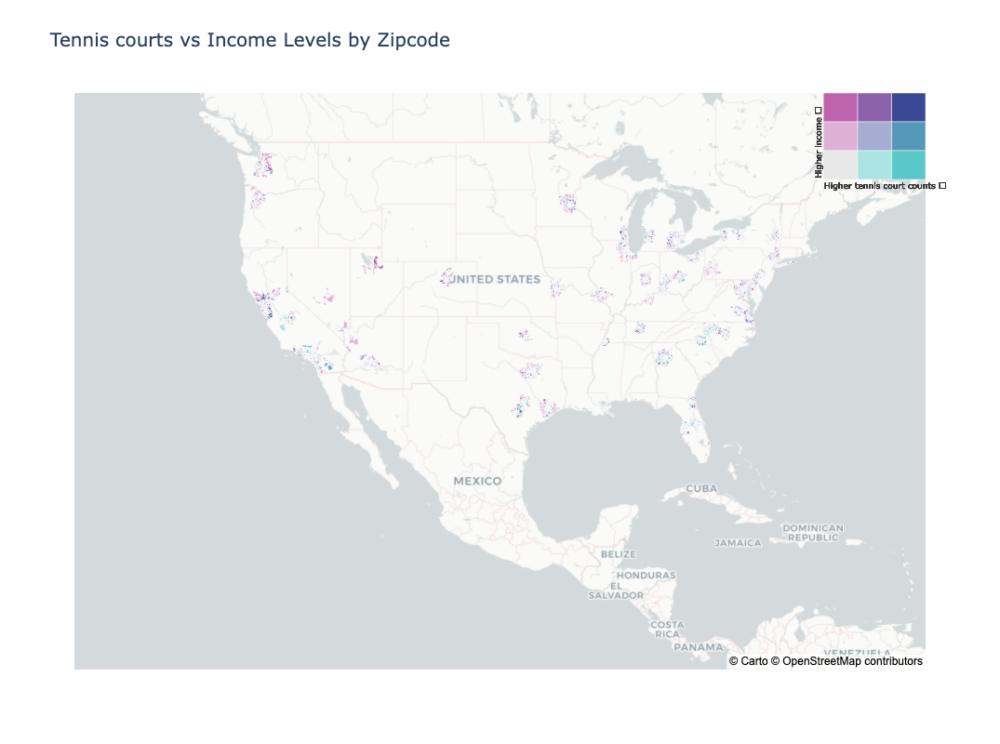

In [214]:
from shapely.geometry import mapping  # Add this import

# Ensure zipcodes are strings (geojson ids must be strings)
df['zipcode'] = df['zipcode'].astype(str)

# Convert shapely geometries to GeoJSON-compatible dictionaries
#df['geometry'] = df['geometry'].apply(mapping)

# Create a GeoJSON FeatureCollection with 'id' field
geojson_data = {
    "type": "FeatureCollection",
    "features": [
        {
            "type": "Feature",
            "geometry": geom,
            "properties": {"zipcode": zipc},
            "id": zipc  # <- this connects geojson features to the 'locations' in the choropleth
        }
        for zipc, geom in zip(df['zipcode'], df['geometry'])
    ]
}



fig = create_bivariate_map(df, color_sets['pink-blue'], name = 'zipcode', ids = 'zipcode', x = 'court_counts', y = 'avg_income', geojson = geojson_data, conf = conf)
fig.show()

In [215]:
import plotly.io as pio

pio.write_html(fig, file="plotly_map.html", include_plotlyjs='cdn', full_html=False, div_id="plotly-map")